### Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier 

import warnings
warnings.filterwarnings("ignore")

### Data pre-processing, EDA

In [2]:
data = pd.read_csv("Data/mobile_price_classification.csv")
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

##### don't have null or NaN values

#### Using ProfileReport to see the overview of data and the relatives of each elements

In [4]:
overview = ProfileReport(df=data)
overview

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### We can see that the data is quite balance:
- The wifi columns the number of mobiles have wifi seem equal to the number of mobiles don't have.
- Other columns don't have much outliers.
- We may be concerned about 3 columns: fc, fc_w, pc because they may have some numberic value are 0.
- We will draw the data of the price range and the ram columns because it has the highest corrlation.
- Don't need to scale

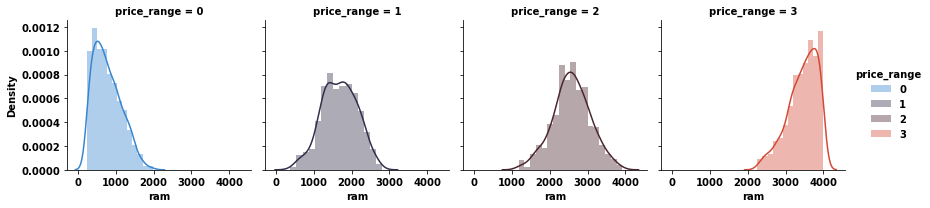

In [5]:
g = sns.FacetGrid(data, col="price_range", hue="price_range",palette="icefire")
g = (g.map(sns.distplot, "ram").add_legend())

#### Look at these graphs we can that there are 4 types of prices range base on the memory of the ram
- Type 1: from 0 to 2000
- Type 2: from 0 to 3000
- Type 3: from 1000 to 4000
- Type 4: from 2000 to 4000
#### However the ranges are still not seperate completely so there will have more elements that effect the price ranges

### Creating train, test by train_test_split of sklearn

In [6]:
X = data.drop('price_range', axis=1).copy()
y = data['price_range'].copy()

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 35, test_size = 0.2)

#### With the problem about classification classes I will use these two models because the data is balanced, the classes is not too much:
- The LogisticRegression may be is the best for this
- The second is Random Forest 
#### Hopefully they will fit

### Logistic Regression (Linear model)

In [8]:
logic = LogisticRegression(multi_class='multinomial')
logic.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial')

In [9]:
print('Train score: ', logic.score(X_train,y_train))

Train score:  0.635625


In [10]:
print('Test score: ', logic.score(X_test,y_test))

Test score:  0.6225


In [11]:
yhat_test = logic.predict(X_test)
print("Test Accuracy is ", accuracy_score(y_test,yhat_test)*100,"%")

Test Accuracy is  62.25000000000001 %


##### The accuracy is about 63% is quite low for the classification model. It means it just fit more than 1/2 data a little bit. So we will choose again some features or parameters for model and hope the accuracy will increase. In this notebook i will choose another parameters with use the GridSearch CV or you can check this website for more information:
https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html


In [12]:
from sklearn.model_selection import GridSearchCV

#### About solver in logistic regression:
- For multiclass problems, only ‘newton-cg’, ‘sag’, ‘saga’ and ‘lbfgs’ handle multinomial loss
- ‘sag’ and ‘saga’ are faster for large datasets
- penalty: l2 is suitable for all that solver

In [13]:
para_grid = {
    'penalty':['l2'],
    'solver':['newton-cg', 'lbfgs', 'sag', 'saga'],
    'multi_class':['multinomial']
}
logistic = GridSearchCV(estimator = LogisticRegression(), param_grid = para_grid, cv = 10)

In [14]:
logistic.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'multi_class': ['multinomial'], 'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'sag', 'saga']})

In [15]:
print(logistic.best_params_)

{'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'newton-cg'}


In [16]:
print('Train score: ', logistic.score(X_train,y_train))
print('Test score: ', logistic.score(X_test,y_test))
yhat_test = logistic.predict(X_test)
print("Test Accuracy is ", accuracy_score(y_test,yhat_test)*100,"%")

Train score:  0.98
Test score:  0.965
Test Accuracy is  96.5 %


In [17]:
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       111
           1       0.96      0.95      0.96       105
           2       0.96      0.93      0.95        92
           3       0.97      0.98      0.97        92

    accuracy                           0.96       400
   macro avg       0.96      0.96      0.96       400
weighted avg       0.96      0.96      0.96       400



#### As you can see the parameters in this situation is important. The model is now 96.5% accurancy so fit and suitable for the model and the precision and recall are ok so no overfitting.
#### May be with the larger model the solver: saga will help you and in this the newton-cg is more effficient.

### Random Forest (Non-Linear model)

In [18]:
# create randomforest classifier model
forest = RandomForestClassifier(random_state = 35)
# fitting model
forest.fit(X_train, y_train)

RandomForestClassifier(random_state=35)

In [19]:
print('Train score: ', forest.score(X_train,y_train))
print('Test score: ', forest.score(X_test,y_test))
yhat_test = forest.predict(X_test)
print("Test Accuracy is ", accuracy_score(y_test,yhat_test)*100,"%")

Train score:  1.0
Test score:  0.8875
Test Accuracy is  88.75 %


In [20]:
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.93      0.92      0.92       111
           1       0.84      0.85      0.84       105
           2       0.83      0.87      0.85        92
           3       0.95      0.91      0.93        92

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.89      0.89      0.89       400



- The train score is 100%, it seems not good -> some not importance features may lead to the overfitting (it presented clearly in the confusion matrix in calss 1 and 2).
- May be with the well-done scaled data can also lead to this.
- So now will select some important features or change some parameters just like the logistic model to adjust this overfitting. 

#### Choose importance features for Random Forest

In [21]:
importance_features = pd.Series(data = forest.feature_importances_, index=X.columns).sort_values(ascending=False)
importance_features

ram              0.470807
battery_power    0.073334
px_width         0.057747
px_height        0.056479
mobile_wt        0.040249
int_memory       0.039227
talk_time        0.032221
pc               0.029829
sc_w             0.029426
clock_speed      0.028611
sc_h             0.026876
fc               0.026868
n_cores          0.025207
m_dep            0.023351
dual_sim         0.007036
touch_screen     0.007034
blue             0.007022
wifi             0.006728
four_g           0.006211
three_g          0.005737
dtype: float64

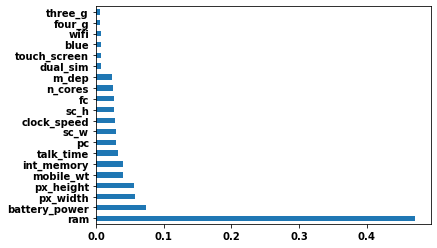

In [22]:
importance_features.plot(kind='barh')
plt.show()

- I will drop 6 columns from the first in the data train and test

In [23]:
X_train_new = X_train.drop(labels = ["dual_sim", "touch_screen", "blue", "wifi","four_g", "three_g"], axis = 1).copy()
X_test_new = X_test.drop(labels = ["dual_sim", "touch_screen", "blue", "wifi","four_g", "three_g"], axis = 1).copy()

In [24]:
X_train_new.head()

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
1583,964,2.0,0,22,0.7,86,8,0,225,1234,2577,17,16,5
350,609,3.0,15,44,0.3,117,1,16,58,1253,2581,15,11,15
1726,990,2.7,3,15,0.9,153,2,7,1466,1717,2698,11,8,6
825,1954,0.6,8,7,0.9,126,3,9,673,690,3438,17,12,13
1230,697,2.7,5,20,0.4,173,2,6,478,1477,259,12,6,4


In [25]:
X_test_new.head()

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
1011,772,2.6,7,6,0.1,100,2,10,741,1471,929,13,6,18
319,1097,2.1,6,64,0.2,161,3,8,419,1914,1725,14,5,9
1695,1470,2.2,4,33,0.4,138,7,10,1790,1988,1633,18,4,4
1384,1163,1.9,6,2,0.9,133,5,20,919,1076,1568,14,0,19
1144,1285,2.4,1,51,1.0,140,7,2,475,500,2094,8,0,10


#### Upload new data train to the model

In [26]:
forest.fit(X_train_new, y_train)

RandomForestClassifier(random_state=35)

In [27]:
print('Train score: ', forest.score(X_train_new,y_train))
print('Test score: ', forest.score(X_test_new,y_test))
yhat_test = forest.predict(X_test_new)
print("Test Accuracy is ", accuracy_score(y_test,yhat_test)*100,"%")

Train score:  1.0
Test score:  0.8975
Test Accuracy is  89.75 %


In [28]:
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.94      0.93      0.94       111
           1       0.85      0.88      0.86       105
           2       0.85      0.86      0.85        92
           3       0.94      0.92      0.93        92

    accuracy                           0.90       400
   macro avg       0.90      0.90      0.90       400
weighted avg       0.90      0.90      0.90       400



##### The model still overfit. Let's try to change the parameters

#### Change parameters for Random Forest

##### Data before select

In [29]:
# create randomforest classifier model
forest = RandomForestClassifier(random_state = 35, max_depth = 4)
# fitting model
forest.fit(X_train, y_train)

RandomForestClassifier(max_depth=4, random_state=35)

In [30]:
print('Train score: ', forest.score(X_train,y_train))
print('Test score: ', forest.score(X_test,y_test))
yhat_test = forest.predict(X_test)
print("Test Accuracy is ", accuracy_score(y_test,yhat_test)*100,"%")

Train score:  0.8875
Test score:  0.835
Test Accuracy is  83.5 %


In [31]:
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       111
           1       0.75      0.84      0.79       105
           2       0.76      0.66      0.71        92
           3       0.90      0.89      0.90        92

    accuracy                           0.83       400
   macro avg       0.83      0.83      0.83       400
weighted avg       0.84      0.83      0.83       400



##### After select features

In [32]:
# create randomforest classifier model
forest = RandomForestClassifier(random_state = 35, max_depth = 4)
# fitting model
forest.fit(X_train_new, y_train)

RandomForestClassifier(max_depth=4, random_state=35)

In [33]:
print('Train score: ', forest.score(X_train_new,y_train))
print('Test score: ', forest.score(X_test_new,y_test))
yhat_test = forest.predict(X_test_new)
print("Test Accuracy is ", accuracy_score(y_test,yhat_test)*100,"%")

Train score:  0.868125
Test score:  0.8225
Test Accuracy is  82.25 %


In [34]:
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       111
           1       0.75      0.81      0.78       105
           2       0.77      0.60      0.67        92
           3       0.84      0.93      0.89        92

    accuracy                           0.82       400
   macro avg       0.82      0.82      0.81       400
weighted avg       0.82      0.82      0.82       400



#### The overfitting problem can be fixed when we change the parameter max_depth. And we can see that with the dataset that well-done scale choose all elements may be better for the model than drop somethings ( but not much 83.5% compare with 82.25%).

### Conclusion: the logistic regression is good model for this data if choose the correctly parameters